

==================== VISUALIZING FOLD 0 (Thresh: 0.7) ====================


C:\Users\lytten\AppData\Local\Temp\ipykernel_9436\1662906476.py:88: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=C

Test Patients in this fold: ['D2-001' 'D2-048' 'D2-027' 'D2-060' 'D2-019' 'D2-022' 'D2-018' 'D2-010']

--- Patient D2-001 ---


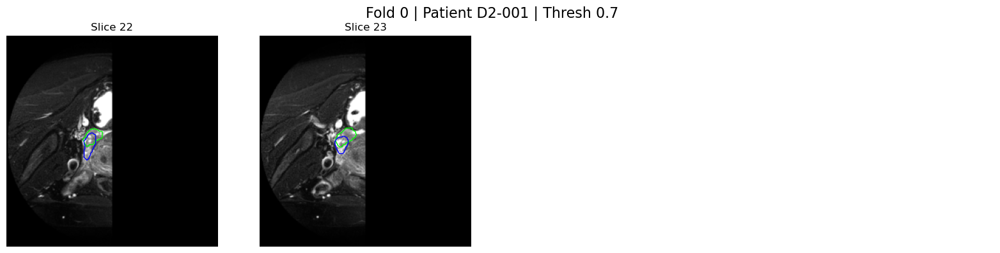


--- Patient D2-048 ---


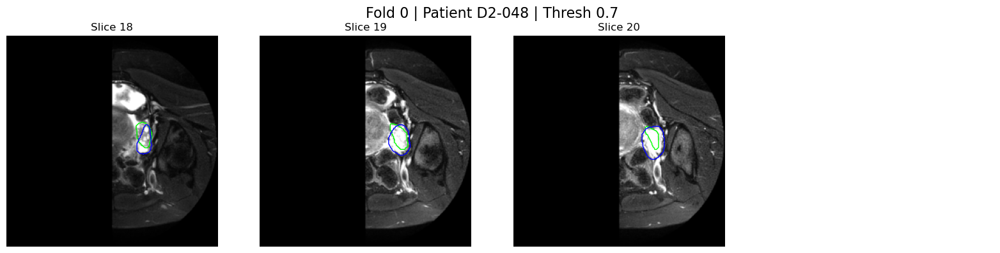


--- Patient D2-027 ---


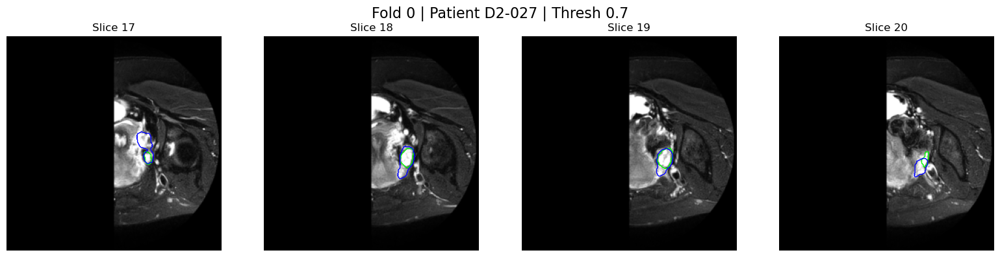


--- Patient D2-060 ---


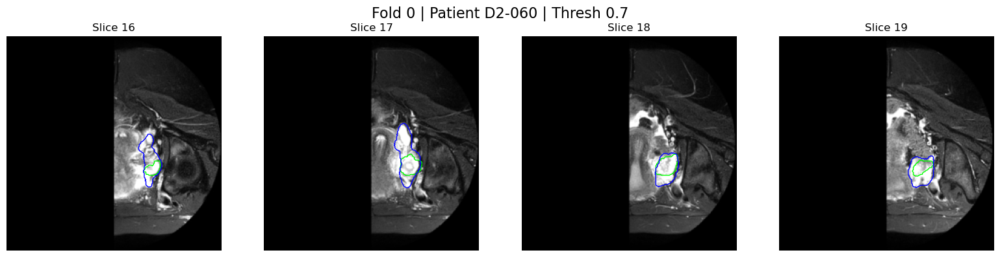


--- Patient D2-019 ---


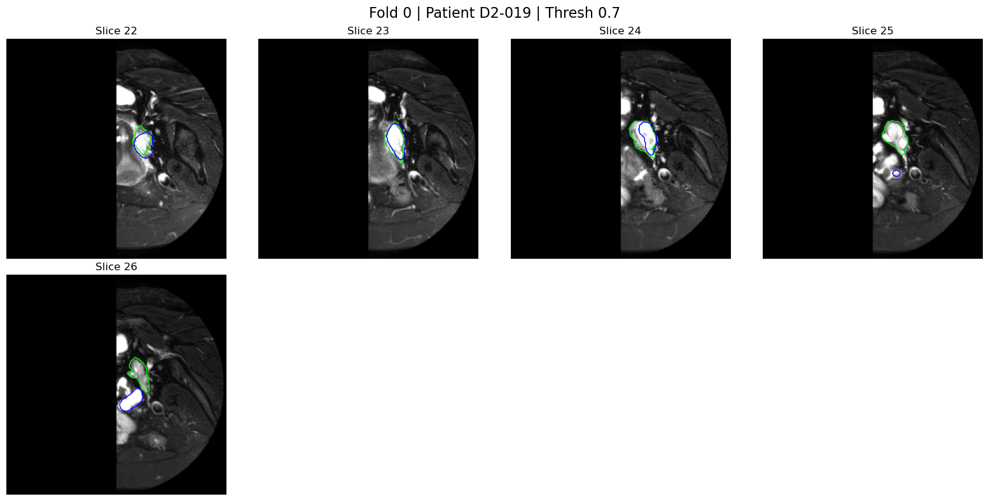


--- Patient D2-022 ---


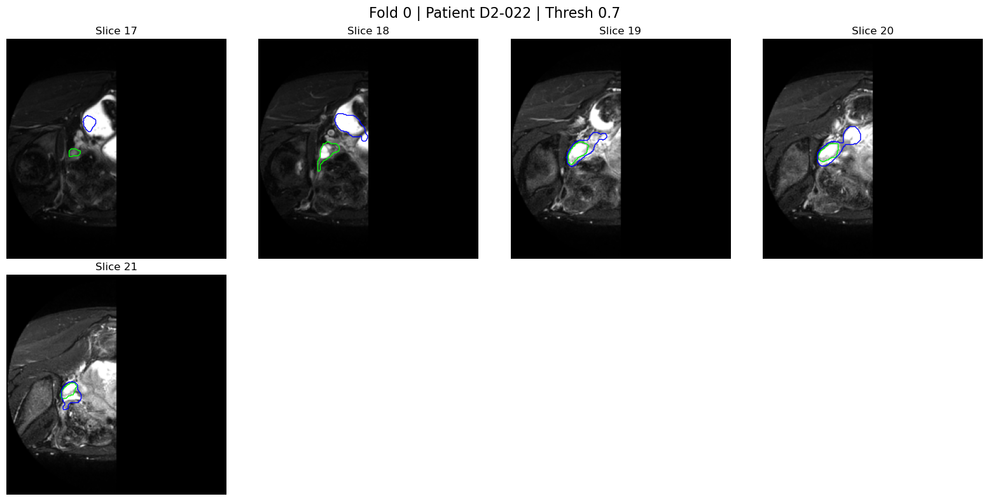


--- Patient D2-018 ---


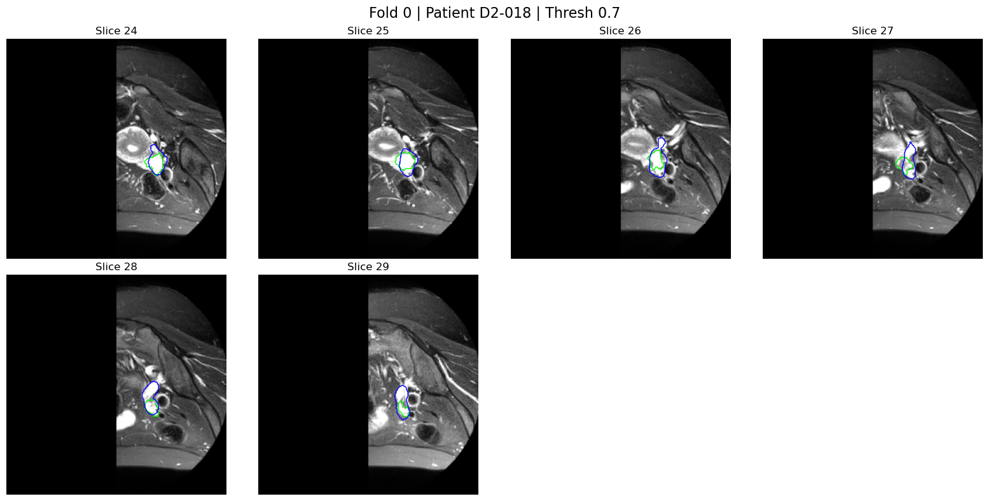


--- Patient D2-010 ---


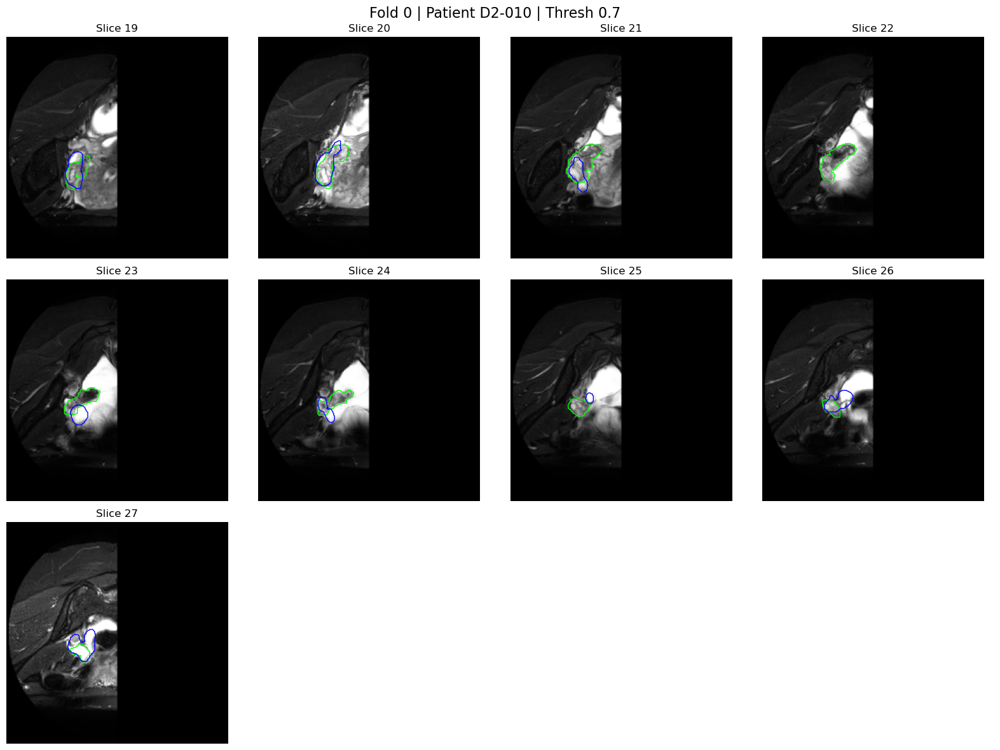



==================== VISUALIZING FOLD 2 (Thresh: 0.6) ====================
Test Patients in this fold: ['D2-051' 'D2-014' 'D2-028' 'D2-073' 'D2-058' 'D2-021' 'D2-025']

--- Patient D2-051 ---


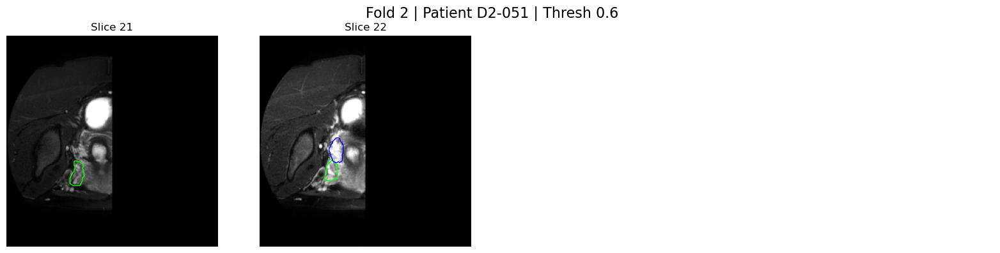


--- Patient D2-014 ---


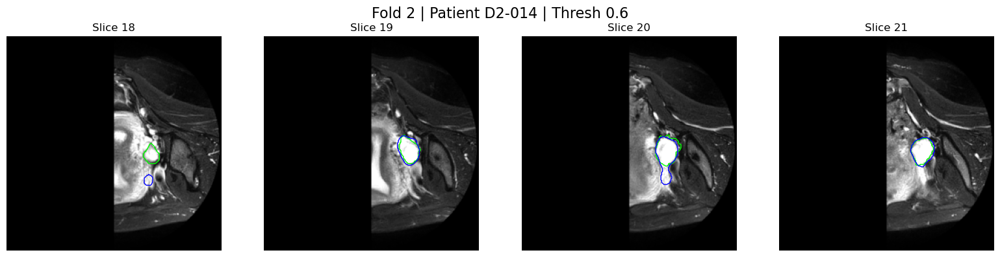


--- Patient D2-028 ---


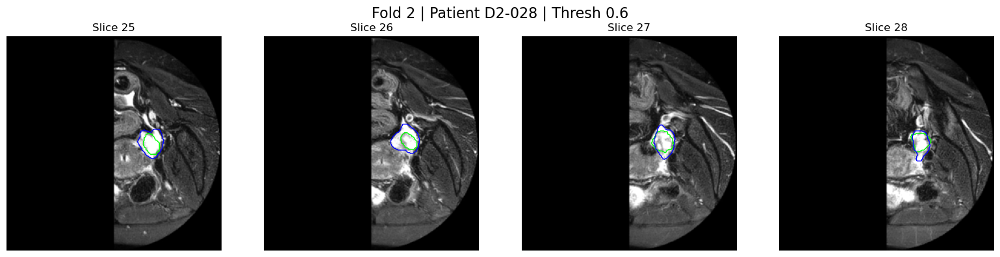


--- Patient D2-073 ---


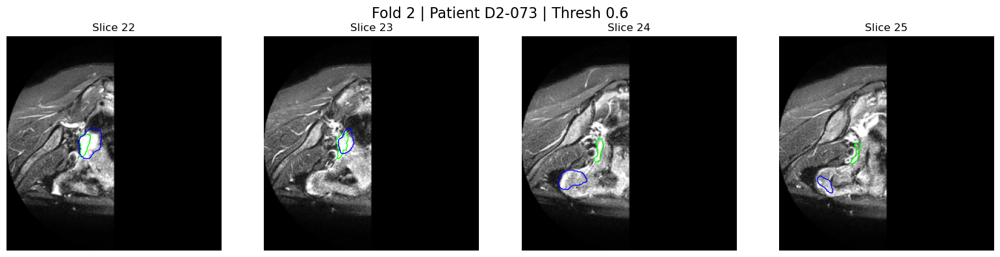


--- Patient D2-058 ---


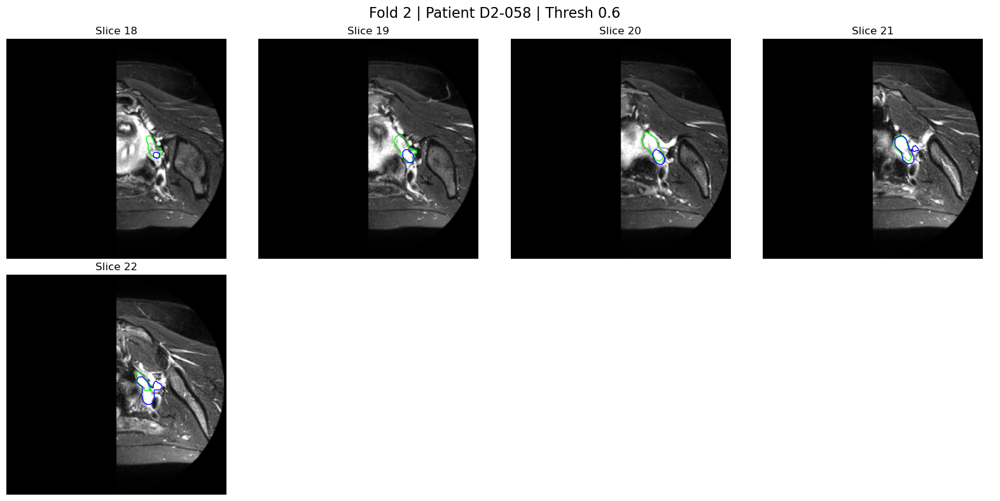


--- Patient D2-021 ---


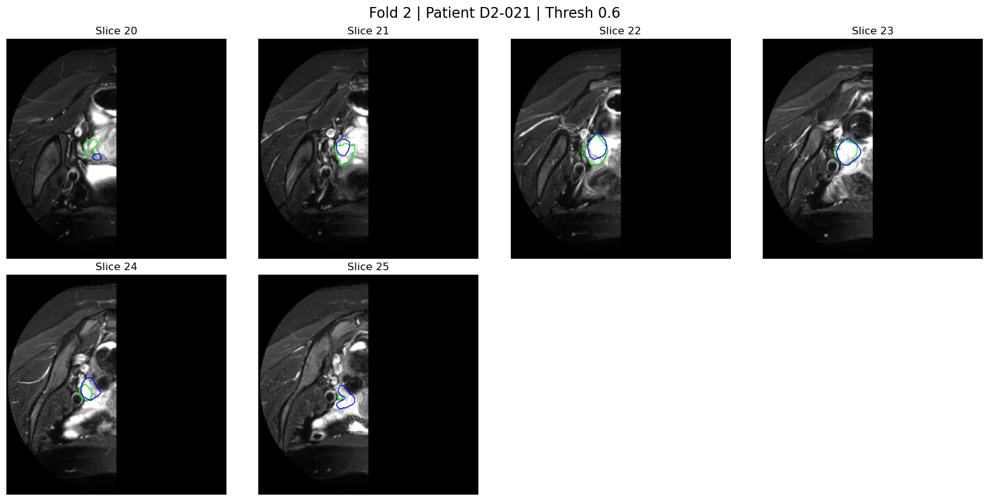


--- Patient D2-025 ---


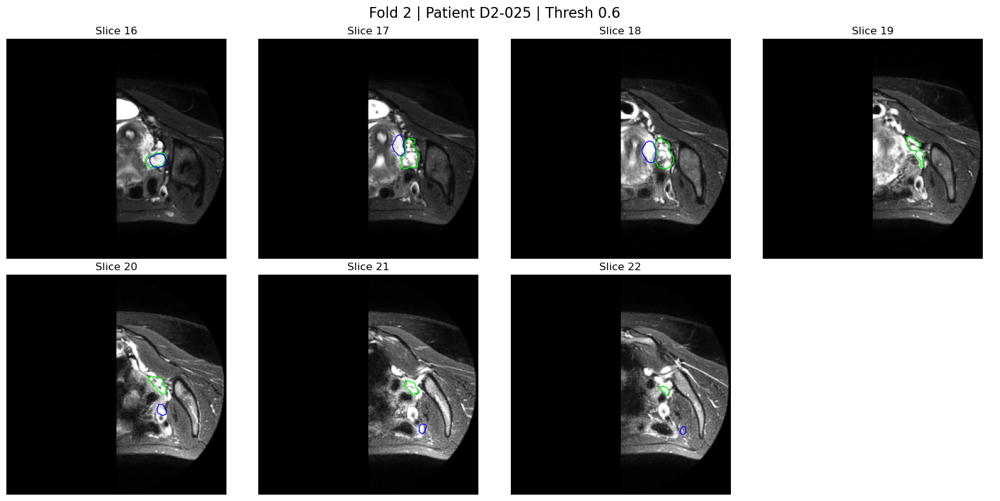



==================== VISUALIZING FOLD 3 (Thresh: 0.3) ====================
Test Patients in this fold: ['D2-016' 'D2-029' 'D2-052' 'D2-017' 'D2-007' 'D2-026' 'D2-044']

--- Patient D2-016 ---


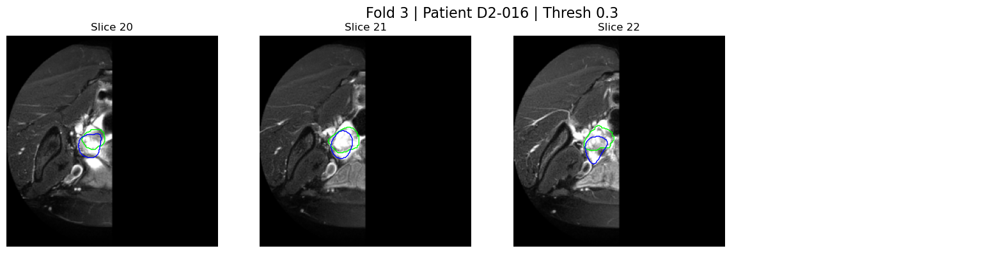


--- Patient D2-029 ---


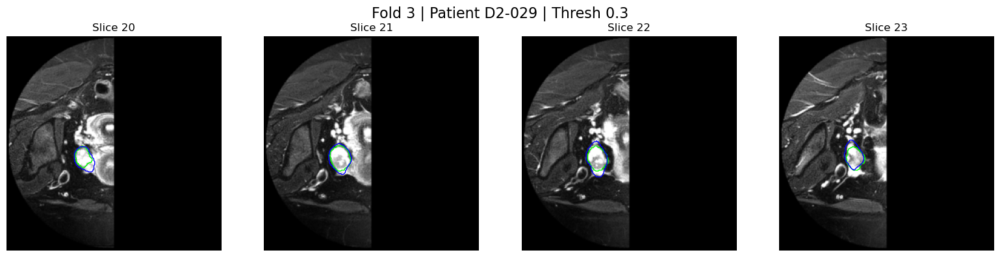


--- Patient D2-052 ---


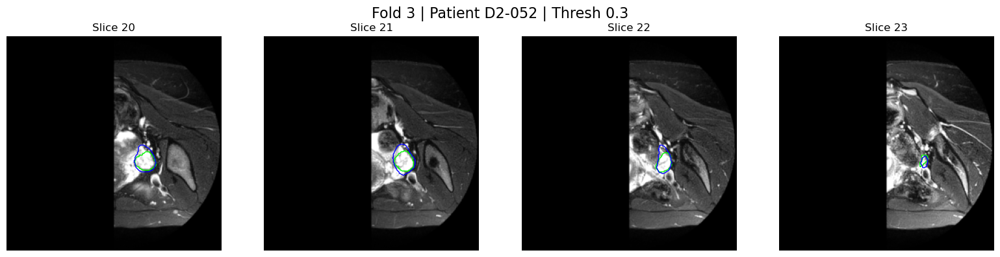


--- Patient D2-017 ---


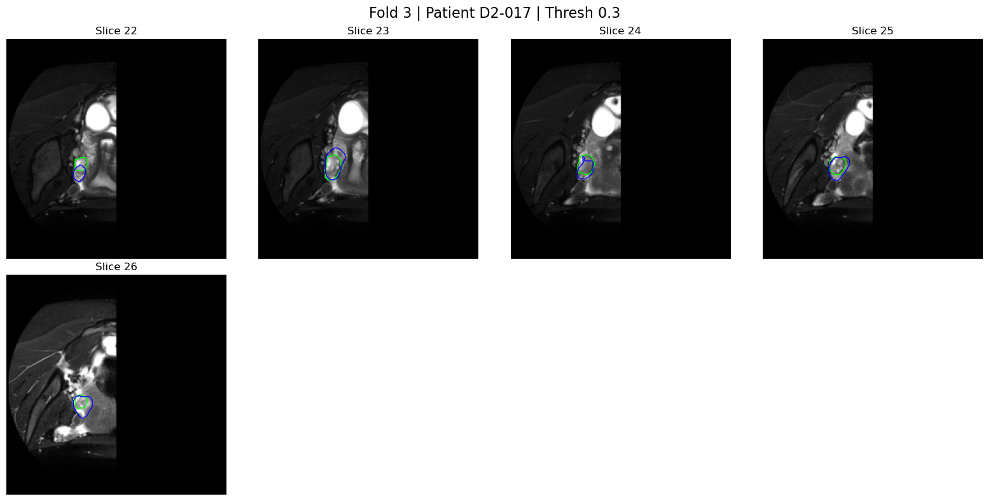


--- Patient D2-007 ---


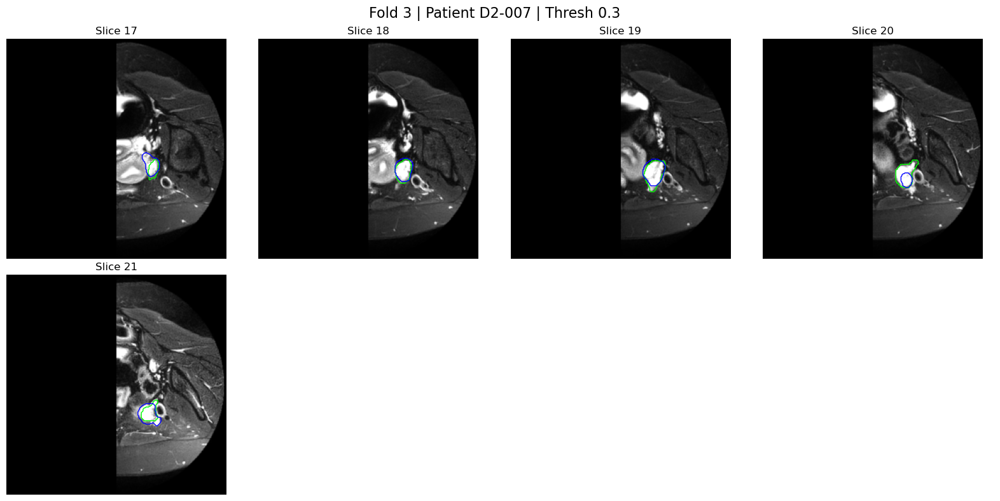


--- Patient D2-026 ---


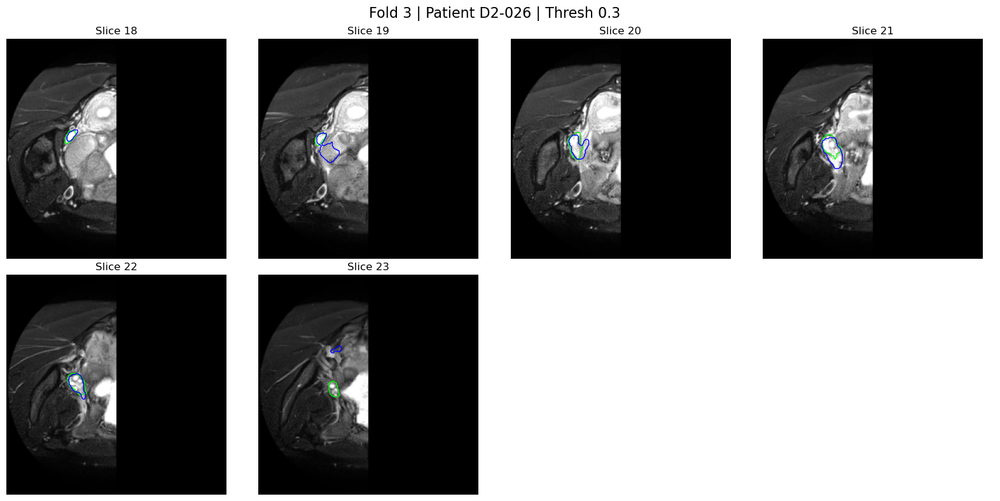


--- Patient D2-044 ---


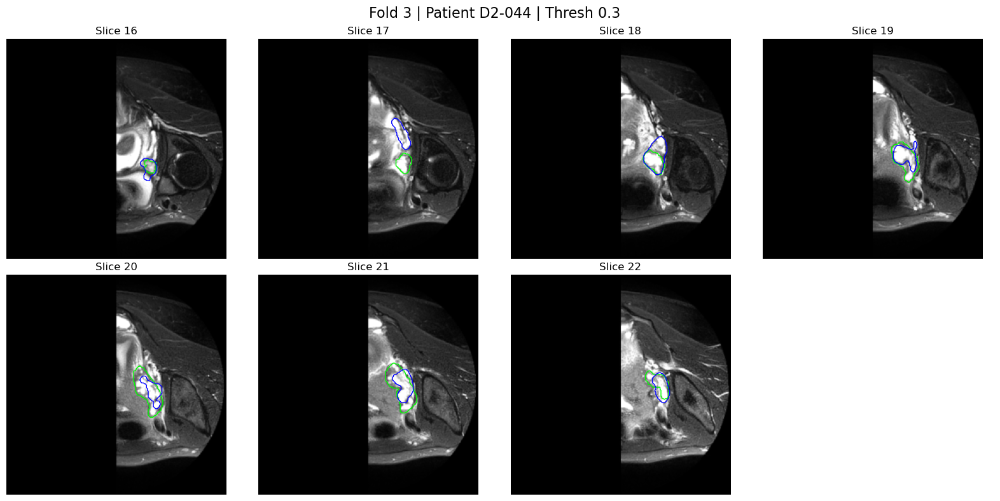

In [ ]:
import torch # :)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torchvision.transforms as T
import nibabel as nib
from pathlib import Path
from skimage import measure
import torch.nn as nn

# --- 1. RE-DEFINE ARCHITECTURE (Must match training exactly) ---
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True), nn.BatchNorm2d(F_int))
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True), nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu = nn.ReLU(inplace=True)
    def forward(self, g, x):
        return x * self.psi(self.relu(self.W_g(g) + self.W_x(x)))

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1), nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1), nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.double_conv(x)

class AttentionUNet(nn.Module):
    def __init__(self, n_channels=1, n_classes=1):
        super(AttentionUNet, self).__init__()
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(64, 128))
        self.down2 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(128, 256))
        self.down3 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(256, 512))
        self.down4 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(512, 1024))
        self.up1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.att1 = AttentionGate(F_g=512, F_l=512, F_int=256)
        self.conv1 = DoubleConv(1024, 512)
        self.up2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.att2 = AttentionGate(F_g=256, F_l=256, F_int=128)
        self.conv2 = DoubleConv(512, 256)
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.att3 = AttentionGate(F_g=128, F_l=128, F_int=64)
        self.conv3 = DoubleConv(256, 128)
        self.up4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.att4 = AttentionGate(F_g=64, F_l=64, F_int=32)
        self.conv4 = DoubleConv(128, 64)
        self.outc = nn.Conv2d(64, n_classes, kernel_size=1)
    def forward(self, x):
        s1 = self.inc(x); s2 = self.down1(s1); s3 = self.down2(s2); s4 = self.down3(s3); s5 = self.down4(s4)
        d4 = self.up1(s5); s4_att = self.att1(g=d4, x=s4); d4 = self.conv1(torch.cat([d4, s4_att], dim=1))
        d3 = self.up2(d4); s3_att = self.att2(g=d3, x=s3); d3 = self.conv2(torch.cat([d3, s3_att], dim=1))
        d2 = self.up3(d3); s2_att = self.att3(g=d2, x=s2); d2 = self.conv3(torch.cat([d2, s2_att], dim=1))
        d1 = self.up4(d2); s1_att = self.att4(g=d1, x=s1); d1 = self.conv4(torch.cat([d1, s1_att], dim=1))
        return self.outc(d1)

# --- 2. CONFIG ---
CONFIG = {
    "data_root": "../data/UT-EndoMRI/D2_Half_Split",
    "manifest_path": "../data/UT-EndoMRI/D2_Half_Split/d2_half_split_manifest.csv",
    "model_dir": "../models/final_5fold_results",
    "device": "cuda" if torch.cuda.is_available() else "cpu",
    "image_size": 256  # FORCE VISUALIZATION TO THIS SIZE
}

df = pd.read_csv(CONFIG["manifest_path"])

def keep_largest_component(mask):
    labels = measure.label(mask)
    if labels.max() == 0: return mask
    largest_cc = labels == np.argmax(np.bincount(labels.flat)[1:]) + 1
    return largest_cc.astype(np.float32)

def visualize_complete_test_set(fold_idx, threshold):
    print(f"\n\n{'='*20} VISUALIZING FOLD {fold_idx} (Thresh: {threshold}) {'='*20}")
    
    # Load Model
    model_path = Path(CONFIG["model_dir"]) / f"best_model_fold_{fold_idx}.pth"
    if not model_path.exists():
        print(f"Model not found: {model_path}")
        return

    model = AttentionUNet(n_channels=1, n_classes=1).to(CONFIG["device"])
    model.load_state_dict(torch.load(model_path, map_location=CONFIG["device"]))
    model.eval()
    
    # Get Test Patients
    test_patients = df[df['fold'] == fold_idx]['pid'].unique()
    print(f"Test Patients in this fold: {test_patients}")
    
    for pid in test_patients:
        print(f"\n--- Patient {pid} ---")
        row = df[(df['fold'] == fold_idx) & (df['pid'] == pid)].iloc[0]
        
        img_path = Path(CONFIG["data_root"]) / Path(row['t2fs_path']).name
        msk_path = Path(CONFIG["data_root"]) / Path(row['ov_path']).name
        
        img_vol = nib.load(str(img_path)).get_fdata()
        msk_vol = nib.load(str(msk_path)).get_fdata()
        
        # Find ALL positive slices
        z_sums = np.sum(msk_vol, axis=(0,1))
        valid_slices = np.where(z_sums > 0)[0]
        
        if len(valid_slices) == 0:
            print("  No positive slices found in GT.")
            continue
            
        # Plot every positive slice
        n_slices = len(valid_slices)
        cols = 4
        rows = int(np.ceil(n_slices / cols))
        
        fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
        # Handle single slice case
        if rows == 1 and cols == 1: axes = [axes]
        axes = np.array(axes).flatten()
        
        fig.suptitle(f"Fold {fold_idx} | Patient {pid} | Thresh {threshold}", fontsize=16)
        
        for i, z in enumerate(valid_slices):
            ax = axes[i]
            
            # --- PREPROCESSING (Must match training) ---
            img = img_vol[:,:,z]
            msk = msk_vol[:,:,z]
            
            # 1. Norm
            p1, p99 = np.percentile(img, 1), np.percentile(img, 99)
            img_norm = np.clip(img, p1, p99)
            img_norm = (img_norm - img_norm.min()) / (img_norm.max() - img_norm.min() + 1e-8)
            
            # 2. Resize to 256 (This was the missing step in visualization!)
            # We resize the numpy array directly to ensure plotting alignment
            img_t = torch.from_numpy(img_norm.T).float().unsqueeze(0).unsqueeze(0)
            img_t = TF.resize(img_t, [CONFIG["image_size"], CONFIG["image_size"]], interpolation=T.InterpolationMode.BILINEAR, antialias=True)
            
            msk_t = torch.from_numpy(msk.T).float().unsqueeze(0).unsqueeze(0)
            msk_t = TF.resize(msk_t, [CONFIG["image_size"], CONFIG["image_size"]], interpolation=T.InterpolationMode.NEAREST, antialias=True)
            
            # 3. Inference
            img_gpu = img_t.to(CONFIG["device"])
            with torch.no_grad():
                logits = model(img_gpu)
                prob = torch.sigmoid(logits).cpu().numpy().squeeze()
                pred_raw = (prob > threshold).astype(np.float32)
                pred_pp = keep_largest_component(pred_raw)
            
            # 4. Plotting (Now everything is 256x256)
            img_disp = img_t.squeeze().numpy()
            msk_disp = msk_t.squeeze().numpy()
            
            ax.imshow(img_disp, cmap='gray', origin='lower')
            # GT in Green
            if np.sum(msk_disp) > 0:
                ax.contour(msk_disp, colors='lime', linewidths=1, levels=[0.5])
            # Pred in Blue
            if np.sum(pred_pp) > 0:
                ax.contour(pred_pp, colors='blue', linewidths=1, levels=[0.5])
            # Raw Pred in Red (optional, faint)
            # if np.sum(pred_raw) > 0:
            #     ax.contour(pred_raw, colors='red', linewidths=0.5, alpha=0.5, levels=[0.5])
                
            ax.set_title(f"Slice {z}")
            ax.axis('off')
            
        # Turn off unused axes
        for j in range(i+1, len(axes)):
            axes[j].axis('off')
            
        plt.tight_layout()
        plt.show()

# --- EXECUTE ---
# Run for the folds we care about
# Fold 0 (Thresh 0.7)
visualize_complete_test_set(0, 0.7)

# Fold 2 (Thresh 0.6) - The "Worst" one
visualize_complete_test_set(2, 0.6)

# Fold 3 (Thresh 0.3) - The "Best" one
visualize_complete_test_set(3, 0.3)

### Final Report Strategy
You are now ready to write. Here is the structure based on your data:

1.  **Abstract:** We tackled single-label ambiguity in MRI. Proposed "Half-Split" + Attention U-Net + Post-Processing. Achieved 0.52 Dice (up from 0.25 baseline).
2.  **Introduction:** Ovaries are hard (intensity overlap). Data is limited (N=37).
3.  **Methods:**
    *   **Data:** D2_Half_Split (explain why: to align input with single-label GT).
    *   **Model:** Attention U-Net (to focus on small targets).
    *   **Training:** 5-Fold CV, AdamW, DiceBCE.
    *   **Inference:** Per-fold threshold tuning + "Keep Largest Component."
4.  **Results:**
    *   **Table:** Copy the dataframe output you just got.
    *   **Key Figure:** The plot from Fold 3 vs Fold 2 (Best vs Worst).
    *   **Observation:** "Post-processing was selected in 100% of folds, proving that false-positive noise is the main error source."
5.  **Discussion:**
    *   **Why 0.52?** It's not 0.90, but given the data constraints (N=37) and the difficulty (T2FS intensity), it's a solid result.
    *   **The Fold 3 Anomaly:** Discuss why Fold 3 was so high (0.69). Was the threshold (0.3) the key? Did it capture faint ovaries that 0.5 missed?
    *   **Future Work:** 3D U-Net (instead of 2D slices) to use z-axis context.

PROLOGUE
Exploratory Phase & Parameter Stabilization

CONTEXT
Before establishing the formal experimental pipeline (Notebooks 27-34), we conducted an extensive exploratory phase to understand the UT-EndoMRI dataset and establish a stable training environment. This phase was characterized by ad-hoc experimentation with various architectures (standard U-Net, basic CNNs) and data loading strategies.

ISSUES IDENTIFIED

    Training Instability: Initial runs using standard hyperparameters (e.g., SGD, Learning Rates ≥1e−3) frequently resulted in diverging loss curves or models getting stuck in local minima (predicting all zeros).

    The "Side-Swap" Phenomenon: During early qualitative checks, we observed models predicting anatomically correct ovaries that received a Dice score of 0.0. Investigation revealed the core dataset flaw: the model was segmenting the visible left ovary, but the ground truth only annotated the right ovary. This confirmed that the problem was not just detecting ovaries, but handling label ambiguity.

OUTCOME (The "Golden Set")
Through iterative trial-and-error, we calibrated a set of "Golden Parameters" that guaranteed convergence and stability. We locked these variables in for the baseline unet experiment:

    Optimizer: AdamW (for better generalization than Adam).

    Learning Rate: 1e-4 (Constant).

    Batch Size: 12 (Maximized for our GPU memory).

    Patience: 30 epochs.

THE RESET
With the stability issues resolved and the "Single-Label" problem identified as the primary adversary, we discarded the ad-hoc codebases. We initiated a new, rigorous pipeline starting with Experiment 01, designed specifically to isolate and solve the data ambiguity problem rather than randomly testing architectures.

START
started with baseline unet from unet paper and raovseg paper

ISSUES
it had low quantitative performance and qualitative performance
from earlier entry experimentation and data exploring we hypothesized that the ground truth containing only one ovary, when humans have two, was a major issue
in the early experimentation and from this baseline unet we could tell that the model was getting penalized for finding the extra ovary

PROPOSED SOLUTION
half all slices by removing the half of the image that did not contain the ground truth mask (the annotated ovary)

RESULT
very good performance boost from 0.2518 to 0.4946 from just changing the underlying data

DISCUSSION
there's a lot to be discussed from essentially doing "we chopped the data in half to make it easier for the model to train"
we argue that this solution is actually deployable even though it alters the data - if the model was ever to be used it would just have to see each half of the input slices at a time, and then the result would be the two halves with their inferences stitched back together afterwards (should we do proof of concept here on some test data?)

ISSUES
we succesfully eliminated the problem of the model being penalized for finding two ovaries but even on this altered data the model was still having trouble finding the single ovary
from qualitative assessment we identified multiple problems:
    model gets distracted by tissue with the same intensity as ovaries, guessing multiple blobs (false positives)
        a subproblem here was that ovaries did not always appear with the same intensity - sometimes they appeared in the greyish intensity mentioned in the paper when discussing their preprocessing function, and sometimes the ovaries appeared very bright
    model over- and undersegmented the ovaries it did find (imperfect tracing)
    model sometimes does not find the ovary (false negative), especially when they are small

PROPOSED SOLUTION
adding attention gates, replacing the simple skip connections
we hypothesized that replacing standard skip connections with Attention Gates would mitigate false positives by utilizing global anatomical context to suppress task-irrelevant background features (such as bright fat or vessels), while simultaneously boosting the feature response of small, variable-intensity ovaries that might otherwise be lost during downsampling

RESULT
small quantitative performance increase
qualitatively we saw reduced false positives (patient 061 + 015) and reduced false negatives (patient 023)

DISCUSSION
i don't know, the attention gates did their job i guess?

ISSUES
although we definitely improved false positives and false negatives, there were still some pretty major false positives going on when inspecting the inferences on the validation set
the model was still getting really tempted by big intensely bright areas, leading us to believe that the model was highly dependent on intensity for its detection

PROPOSED SOLUTION
use the special preprocessing function used in the paper to highlight the middle intensity area where the ovaries were believed to exist
the idea here was to make those specific ovary intensity ranges pop more and suppress the intensities outside this range

RESULT
worse performance quantitatively
qualitatively we saw more false positives and false negatives

DISCUSSION
see failure analysis plot from notebook 30
sometimes the ovaries would be suppressed along side the really bright blobs BECAUSE the ovaries tend to not only appear in their proposed middle intensities
sometimes the preprocessing did make the ovaries pop and help the model find them
however it was clear after some analysis that the ovaries appeared bright like the tissue we were trying to suppress, way too often, resulting in the preprocessing hurting more than it helped
we even considered tweaking the preprocessing function, but the ovaries' two intensity modalities made it impossible to highlight one type of ovary intensity without hurting the other

ISSUES
back to the drawing board with the same issues as the attention unet model
false positives and false negatives

PROPOSED SOLUTION
transfer learning
we hypothesized that the problem was that the model relied too much on pixel intensities and not enough on finding actual shapes and edges
if the model can't tell them apart by Brightness (how white it is), it must learn to tell them apart by Texture (how "bumpy" or "grainy" it is)
however, learning to recognize complex textures (like the difference between "smooth white blob" and "grainy white blob") requires a lot of data
we only have 37 patients. A model trained from scratch on such a small dataset struggles to learn these complex, subtle texture filters. It takes the path of least resistance: "Just pick the bright stuff."
The Solution (Transfer Learning): We brought in ResNet34, pretrained on ImageNet (1.2 million natural images)
ResNet34 has already spent thousands of GPU hours learning how to detect edges, curves, textures, and complex patterns (to distinguish a tennis ball from a lemon, or fur from skin)
We hoped to "transplant" this pre-learned visual cortex into our U-Net. We argued that the ResNet encoder would already possess the specific feature extractors needed to see the "grainy texture" of an ovary, allowing it to ignore the "smooth texture" of the fat, even if both were equally bright

RESULT
quantitatively mostly the same
qualitatively we saw:
increased false positives (patient 015 + 005 + 012)
increased false negatives (patient 023 + 057)

DICUSSION
even though we had only slightly worse quantitative performance on the test set we did see pretty apparent bad performance on the qualtiative analysis of the validation set
so with the qualitative analysis and with the rule of parsimony in mind (two similar models - choose the simpler one), we decided not to move on with transfer learning

ISSUES
back to the drawing board with the same issues as attention unet model
false positives and false negatives

PROPOSED SOLUTION
CLAHE
we hypothesized that the problem was that the model relied too much on pixel intensities and not enough on finding actual shapes and edges
if the model can't tell them apart by Brightness (how white it is), it must learn to tell them apart by Texture (how "bumpy" or "grainy" it is)
solution CLAHE preprocessing - CLAHE breaks the image into small tiles and equalizes the histogram locally
the hypothesis here was that by forcing local contrast enhancement CLAHE would
    prevent the large bright blobs from dominating the model's attention just because they are bright
    exaggerate the local edges of the ovarian follicles - even if an ovary is dark, CLAHE would stretch the contrast inside that dark region to make the internal structure visible

RESULT
worse performance quantitatively
qualitatively we again saw more false positives and a bunch more false negatives (failing to find a lot of ovaries)

DISCUSSION
it seemed that now where the model couldn't rely as much on brightness and was forced to rely on shapes and edges, it struggled
it could be because of several things
    the clahe equalizing too much, obscuring shapes and edges too
    ovaries being inherently hard to find on such few pixels - if you are only allowed to look for shapes and edges, there isn't a lot of pixels to create those from
    too little data to learn shapes and edges

ISSUES
back to the drawing board with the same issues as attention unet model
false positives and false negatives

PROPOSED SOLUTION
focal tversky loss
We hypothesized that if we couldn't fix the data (Preprocessing failed) and we couldn't fix the feature extractor (Transfer Learning failed), we had to fix how the model learns.
We chose Focal Tversky because it gave us two mathematical knobs to turn, specifically addressing two problems
The "Tversky" Part: Fixing the False Positives
    Standard Dice Loss treats False Positives (FP) and False Negatives (FN) equally (it weighs them 0.5 each)
    The Hypothesis: Tversky loss allows us to weigh FP and FN differently. By setting Alpha = 0.7 and beta = 0.3 we explicitly told the model: "I will punish you more for hallucinating an ovary where there isn't one (FP) than I will for missing a small piece of an ovary (FN)."
The "Focal" Part: Fixing the Laziness
    The Problem: The difference between a "bright ovary" and "bright fat" is subtle (a "Hard Example"). The model was taking the path of least resistance and ignoring these subtle differences.
    The Hypothesis: The Focal parameter gamma reshapes the loss curve. It down-weights the loss for examples the model already classifies well (easy background) and focuses the gradients on the examples where the model is struggling (the hard boundary cases).
    Goal: Force the model to stop coasting on the easy black pixels and work harder to resolve the difficult texture confusion

RESULT
significanty worse quantitative performance as a result of an obvious increase in false positives and false negatives
Severe over-segmentation. As seen in Patients D2-015 and D2-005, the model predicted massive, amorphous blobs that engulfed the ovary and surrounding tissue
Training Dynamics: The loss and Dice curves (Figure X) exhibit extreme instability and oscillation compared to the DiceBCE baseline, indicating the optimizer failed to converge to a stable minimum

DISCUSSION
The "Hard Example" Fallacy in T2FS MRI
The Focal mechanism (gamma) forces the model to focus on "hard examples"—pixels where the prediction confidence is low. In high-contrast datasets (e.g., CT scans), "hard pixels" are usually the fine details of the object boundary.
However, in our T2FS dataset, "hard pixels" are often ambiguous noise (e.g., the fuzzy boundary between an ovary and a bright fluid pocket). By forcing the model to focus on these ambiguous pixels, the Focal loss likely interpreted the noise as "signal that hasn't been learned yet." The model reacted by expanding its prediction mask to encompass the ambiguity, rather than refining the edge.
Optimization Instability (The Jagged Curves)
The training curves show violent oscillations. Focal Tversky Loss introduces non-linearities (powers of gamma) that create a much rougher loss landscape than standard Dice. With a small dataset (N=37), the optimizer likely got stuck in poor local minima or bounced between unstable states. The high variance in the validation curve suggests that the model was overfitting to batch statistics rather than learning generalizable features.
The Alpha-Gamma Conflict
There was a conflict between the Tversky term (which said "Shrink the mask to avoid FPs") and the Focal term (which said "Focus on these uncertain edge pixels"). The visual results suggest the Focal term won. The model learned that it incurred a high loss for being "unsure" about the boundary, so it compensated by confidently predicting the entire region as positive, effectively ignoring the Tversky penalty.
Complex loss functions are not a silver bullet for ambiguous data. When ground truth boundaries are uncertain (due to the difficult nature of T2FS imaging), forcing the model to "focus" on those boundaries leads to hallucinations rather than precision. Standard Dice Loss, which is more robust to boundary noise, is superior for this specific task.

ISSUES
We are back to the drawing board (again) with the Attention U-Net (Exp 03) as our champion model
We have exhausted Architectural interventions (Transfer Learning), Data Representation interventions (Preprocessing/CLAHE), and Optimization interventions (Loss Function). All of them failed to outperform the baseline Attention U-Net
The remaining errors (small floating false positives and low-confidence true positives) are likely irreducible during training given the small N=37 dataset. The model is learning the correct features, but the decision boundary (the final sigmoid activation) is suboptimal
Instead of trying to train a better model, we must make the existing model smarter at Inference Time

PROPOSED SOLUTION
We hypothesized that we could squeeze significant performance out of the Attention U-Net by tuning the decision logic rather than the weights
Threshold Tuning: The standard 0.5 cutoff is arbitrary. Since ovaries are often low-contrast, a lower threshold might boost sensitivity, or a higher one might kill noise. We proposed tuning this per-fold on the validation set.
Post-Processing (Keep Largest Component): Our "Half-Split" methodology guarantees that each input image contains at most one ground truth object. Therefore, any secondary prediction blobs are, by definition, False Positives. We hypothesized that algorithmically removing all but the largest connected component would instantly clean up the "distracted" predictions we saw in Exp 03
Robust Evaluation (5-Fold CV): To prove this wasn't a fluke, we moved from our fixed Test Set (Fold 0) to a full 5-Fold Cross-Validation to get a statistically valid performance estimate

RESULT
Quantitative Success: The 5-Fold CV yielded a mean 3D Patient Dice of 0.5185. This is our highest robust score yet.
Validation of Post-Processing: The optimization loop selected Keep Largest Component = True for 100% of the folds (5/5). This empirically proves our hypothesis: the model's primary failure mode was indeed "distraction" (multi-blob predictions), and simple geometric logic was the correct fix.
Threshold variance: The optimal threshold varied wildly between folds (from 0.3 to 0.7). This confirms that the model's "confidence" is highly dependent on the specific patient cohort in the training set, validating our decision to tune it dynamically rather than hard-coding it.

DISCUSSION
We spent a lot of time trying to make the model "learn" to ignore background noise (via Attention, ResNet, Focal Loss). In the end, a simple post-processing rule (Keep Largest) did what deep learning could not. This highlights a key lesson in medical AI: Domain Knowledge (Geometry) > Complex Architectures.
The Variance Warning: The high standard deviation across folds (Dice ranging from 0.43 to 0.69) is a critical finding. It suggests that our dataset is not large enough to be representative; some folds contained "easy" patients (high contrast), while others contained "hard" patients (intensity overlap). This implies that future work needs more data, not better models.


Initializing Comparison: Exp02 (Baseline) vs Exp03 (Attention)...


C:\Users\lytten\AppData\Local\Temp\ipykernel_9436\919652845.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model02.load_state_dict(torch.load(CONFIG["model_02_path"],

Loaded Exp02 Model.
Loaded Exp03 Model.
Found 8 patients in Validation Set (Fold 1).

Processing Patient: D2-015


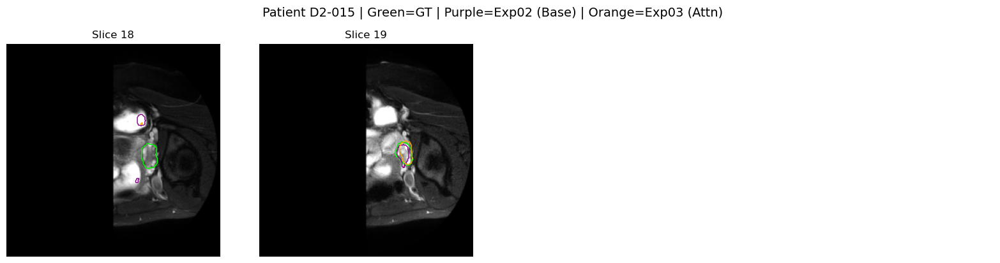


Processing Patient: D2-005


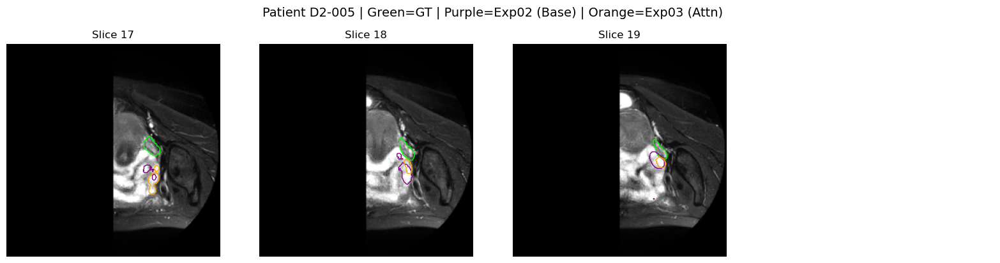


Processing Patient: D2-046


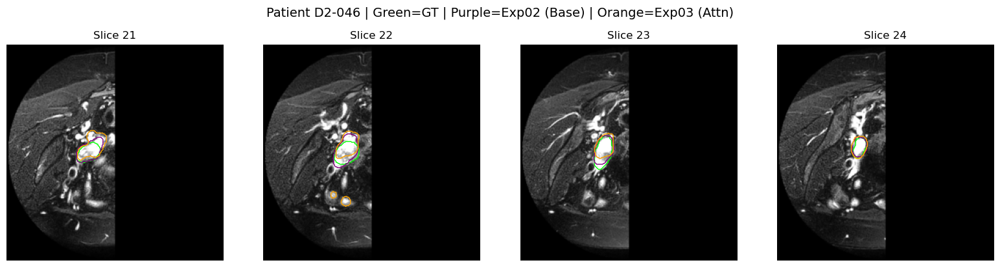


Processing Patient: D2-061


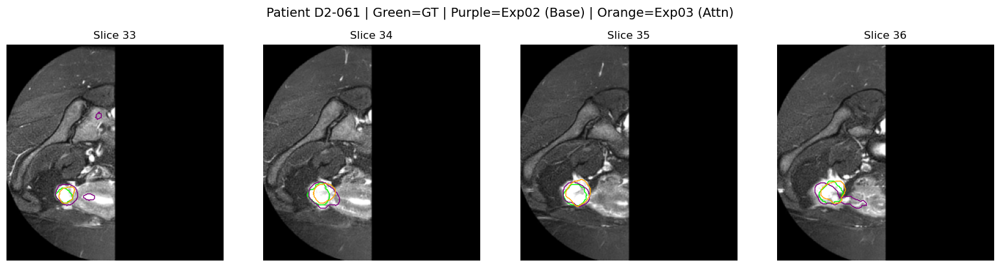


Processing Patient: D2-012


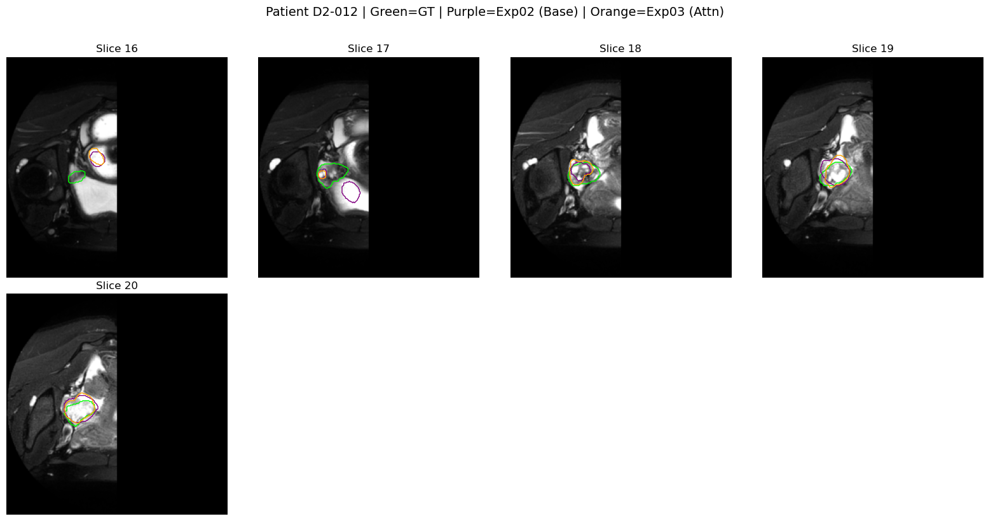


Processing Patient: D2-065


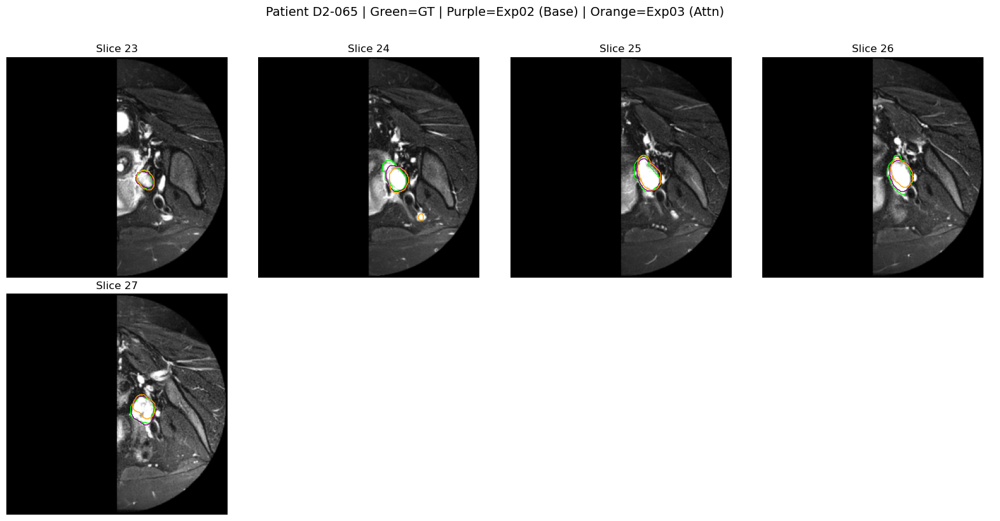


Processing Patient: D2-023


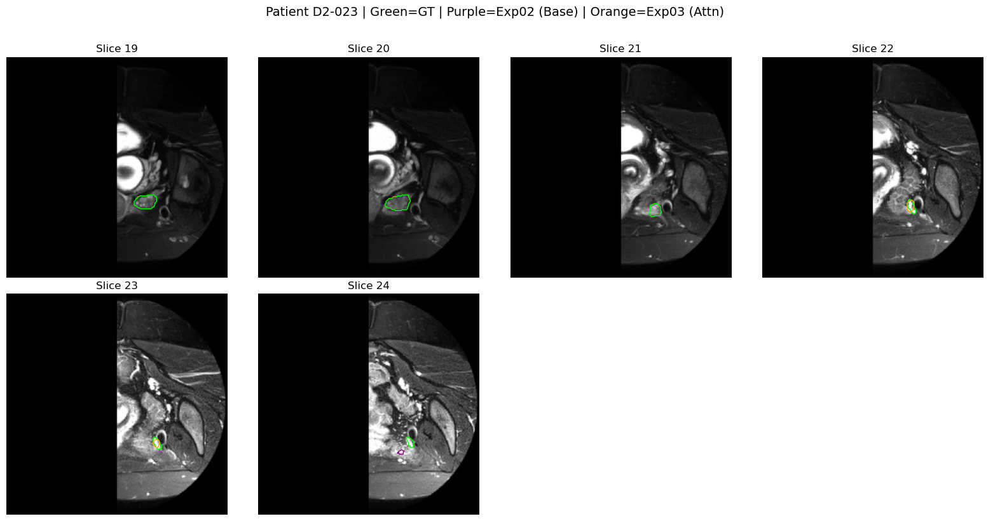


Processing Patient: D2-057


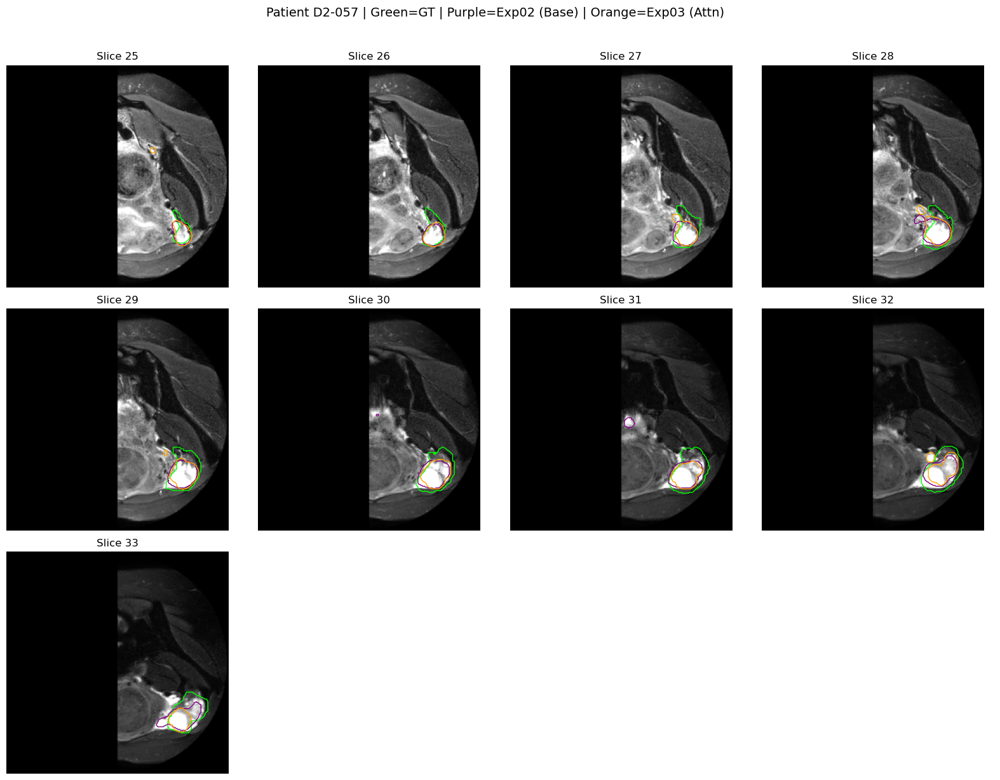

In [7]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torchvision.transforms.functional as TF
import torchvision.transforms as T
import matplotlib.pyplot as plt
import nibabel as nib
from pathlib import Path

# --- CONFIGURATION ---
CONFIG = {
    "data_root": "../data/UT-EndoMRI/D2_Half_Split",
    "manifest_path": "../data/UT-EndoMRI/D2_Half_Split/d2_half_split_manifest.csv",
    # Paths to the specific experiment models
    "model_02_path": "../models/exp02_baseline_half_split/best_model.pth",
    "model_03_path": "../models/exp03_attention_half_split/best_model.pth",
    "device": "cuda" if torch.cuda.is_available() else "cpu",
    "image_size": 256,
    "val_fold": 1  # Fold 1 was the validation set for Exp02/03
}

# ==========================================
# 1. MODEL ARCHITECTURES
# ==========================================

# --- Common Parts ---
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.double_conv(x)

# --- Exp02: Standard U-Net ---
class UNet(nn.Module):
    def __init__(self, n_channels=1, n_classes=1):
        super(UNet, self).__init__()
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(64, 128))
        self.down2 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(128, 256))
        self.down3 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(256, 512))
        self.down4 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(512, 1024))
        self.up1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.conv1 = DoubleConv(1024, 512)
        self.up2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.conv2 = DoubleConv(512, 256)
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv3 = DoubleConv(256, 128)
        self.up4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv4 = DoubleConv(128, 64)
        self.outc = nn.Conv2d(64, n_classes, kernel_size=1)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5)
        x = torch.cat([x, x4], dim=1)
        x = self.conv1(x)
        x = self.up2(x)
        x = torch.cat([x, x3], dim=1)
        x = self.conv2(x)
        x = self.up3(x)
        x = torch.cat([x, x2], dim=1)
        x = self.conv3(x)
        x = self.up4(x)
        x = torch.cat([x, x1], dim=1)
        x = self.conv4(x)
        return self.outc(x)

# --- Exp03: Attention U-Net ---
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True), nn.BatchNorm2d(F_int))
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True), nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu = nn.ReLU(inplace=True)
    def forward(self, g, x):
        return x * self.psi(self.relu(self.W_g(g) + self.W_x(x)))

class AttentionUNet(nn.Module):
    def __init__(self, n_channels=1, n_classes=1):
        super(AttentionUNet, self).__init__()
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(64, 128))
        self.down2 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(128, 256))
        self.down3 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(256, 512))
        self.down4 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(512, 1024))
        self.up1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.att1 = AttentionGate(F_g=512, F_l=512, F_int=256)
        self.conv1 = DoubleConv(1024, 512)
        self.up2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.att2 = AttentionGate(F_g=256, F_l=256, F_int=128)
        self.conv2 = DoubleConv(512, 256)
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.att3 = AttentionGate(F_g=128, F_l=128, F_int=64)
        self.conv3 = DoubleConv(256, 128)
        self.up4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.att4 = AttentionGate(F_g=64, F_l=64, F_int=32)
        self.conv4 = DoubleConv(128, 64)
        self.outc = nn.Conv2d(64, n_classes, kernel_size=1)
    def forward(self, x):
        s1 = self.inc(x); s2 = self.down1(s1); s3 = self.down2(s2); s4 = self.down3(s3); s5 = self.down4(s4)
        d4 = self.up1(s5); s4_att = self.att1(g=d4, x=s4); d4 = self.conv1(torch.cat([d4, s4_att], dim=1))
        d3 = self.up2(d4); s3_att = self.att2(g=d3, x=s3); d3 = self.conv2(torch.cat([d3, s3_att], dim=1))
        d2 = self.up3(d3); s2_att = self.att3(g=d2, x=s2); d2 = self.conv3(torch.cat([d2, s2_att], dim=1))
        d1 = self.up4(d2); s1_att = self.att4(g=d1, x=s1); d1 = self.conv4(torch.cat([d1, s1_att], dim=1))
        return self.outc(d1)

# ==========================================
# 2. EXECUTION
# ==========================================

def run_comparison():
    print("Initializing Comparison: Exp02 (Baseline) vs Exp03 (Attention)...")
    
    # 1. Load Models
    model02 = UNet(n_channels=1, n_classes=1).to(CONFIG["device"])
    model03 = AttentionUNet(n_channels=1, n_classes=1).to(CONFIG["device"])
    
    try:
        model02.load_state_dict(torch.load(CONFIG["model_02_path"], map_location=CONFIG["device"]))
        print("Loaded Exp02 Model.")
    except FileNotFoundError:
        print(f"ERROR: Could not find Exp02 model at {CONFIG['model_02_path']}")
        return

    try:
        model03.load_state_dict(torch.load(CONFIG["model_03_path"], map_location=CONFIG["device"]))
        print("Loaded Exp03 Model.")
    except FileNotFoundError:
        print(f"ERROR: Could not find Exp03 model at {CONFIG['model_03_path']}")
        return
        
    model02.eval()
    model03.eval()
    
    # 2. Load Data Manifest
    df = pd.read_csv(CONFIG["manifest_path"])
    val_patients = df[df['fold'] == CONFIG["val_fold"]]['pid'].unique()
    
    print(f"Found {len(val_patients)} patients in Validation Set (Fold {CONFIG['val_fold']}).")
    
    # 3. Loop Patients
    for pid in val_patients:
        print(f"\nProcessing Patient: {pid}")
        
        # Get patient files
        # Note: Half-Split might have multiple entries per patient (left/right logic handled by file existence)
        # We just grab the first row for the path pattern, assuming standard naming
        row = df[(df['fold'] == CONFIG["val_fold"]) & (df['pid'] == pid)].iloc[0]
        
        img_path = Path(CONFIG["data_root"]) / Path(row['t2fs_path']).name
        msk_path = Path(CONFIG["data_root"]) / Path(row['ov_path']).name
        
        if not img_path.exists():
            print(f"  File not found: {img_path}")
            continue
            
        img_vol = nib.load(str(img_path)).get_fdata()
        msk_vol = nib.load(str(msk_path)).get_fdata()
        
        # Find positive slices
        z_sums = np.sum(msk_vol, axis=(0,1))
        valid_slices = np.where(z_sums > 0)[0]
        
        if len(valid_slices) == 0:
            print("  No positive slices (Skipping)")
            continue
            
        # 4. Prepare Plot
        n_slices = len(valid_slices)
        cols = 4
        rows = int(np.ceil(n_slices / cols))
        fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
        if rows==1 and cols==1: axes=[axes]
        axes = np.array(axes).flatten()
        
        fig.suptitle(f"Patient {pid} | Green=GT | Purple=Exp02 (Base) | Orange=Exp03 (Attn)", fontsize=14, y=1.02)
        
        for i, z in enumerate(valid_slices):
            ax = axes[i]
            
            # --- Preprocessing (Standard Min-Max) ---
            img = img_vol[:,:,z]
            msk = msk_vol[:,:,z]
            
            p1, p99 = np.percentile(img, 1), np.percentile(img, 99)
            img_norm = np.clip(img, p1, p99)
            img_norm = (img_norm - img_norm.min()) / (img_norm.max() - img_norm.min() + 1e-8)
            
            # Resize to 256 for Model
            img_t = torch.from_numpy(img_norm.T).float().unsqueeze(0).unsqueeze(0)
            img_t = TF.resize(img_t, [CONFIG["image_size"], CONFIG["image_size"]], 
                              interpolation=T.InterpolationMode.BILINEAR, antialias=True)
            
            # Resize Mask for Display (to match 256)
            msk_t = torch.from_numpy(msk.T).float().unsqueeze(0).unsqueeze(0)
            msk_t = TF.resize(msk_t, [CONFIG["image_size"], CONFIG["image_size"]], 
                              interpolation=T.InterpolationMode.NEAREST, antialias=True)
            
            # --- Inference ---
            img_gpu = img_t.to(CONFIG["device"])
            
            with torch.no_grad():
                # Exp02
                logits02 = model02(img_gpu)
                pred02 = (torch.sigmoid(logits02) > 0.5).float().cpu().numpy().squeeze()
                
                # Exp03
                logits03 = model03(img_gpu)
                pred03 = (torch.sigmoid(logits03) > 0.5).float().cpu().numpy().squeeze()
            
            # --- Plotting ---
            # Background
            ax.imshow(img_t.squeeze().numpy(), cmap='gray', origin='lower')
            
            # GT (Green)
            gt_np = msk_t.squeeze().numpy()
            if np.sum(gt_np) > 0:
                ax.contour(gt_np, colors='lime', linewidths=1, levels=[0.5])
                
            # Exp02 (Purple)
            if np.sum(pred02) > 0:
                ax.contour(pred02, colors='purple', linewidths=1, levels=[0.5])
                
            # Exp03 (Orange)
            if np.sum(pred03) > 0:
                ax.contour(pred03, colors='orange', linewidths=1, levels=[0.5])
                
            ax.set_title(f"Slice {z}")
            ax.axis('off')
            
        # Clean up empty axes
        for j in range(i+1, len(axes)):
            axes[j].axis('off')
            
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    run_comparison()

Initializing Comparison: Exp03 (Attention) vs Exp05 (Transfer Learning)...


C:\Users\lytten\AppData\Local\Temp\ipykernel_9436\3396661955.py:169: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model03.load_state_dict(torch.load(CONFIG["model_03_path"]

Loaded Exp03 Model.
Loaded Exp05 Model.
Found 8 patients in Validation Set (Fold 1).

Processing Patient: D2-015


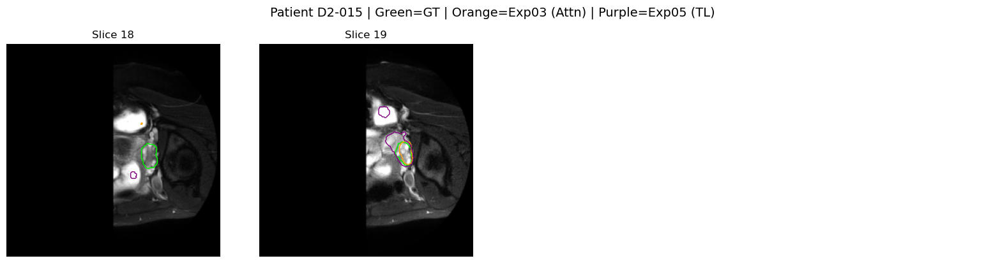


Processing Patient: D2-005


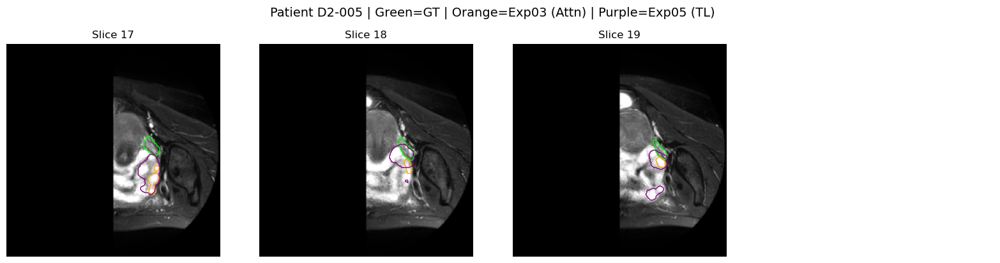


Processing Patient: D2-046


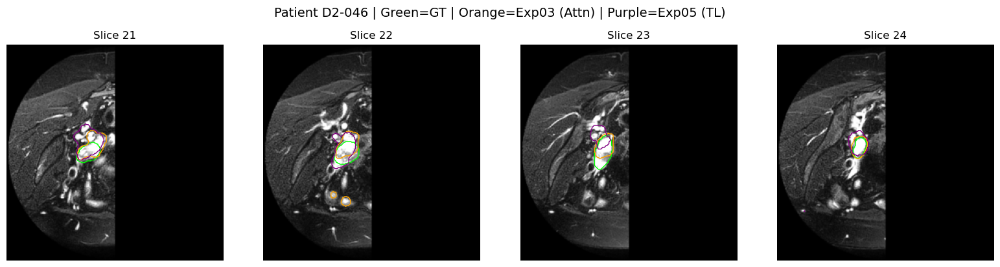


Processing Patient: D2-061


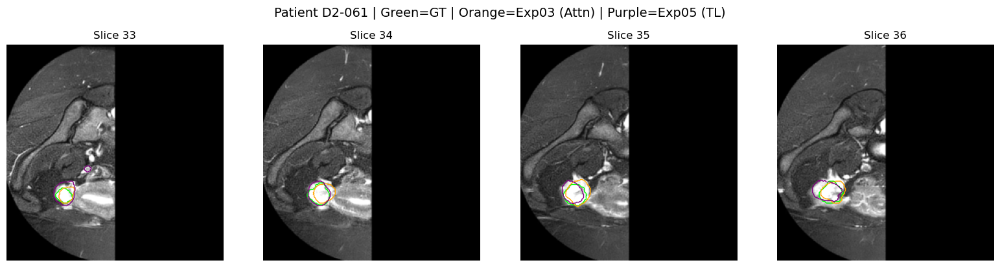


Processing Patient: D2-012


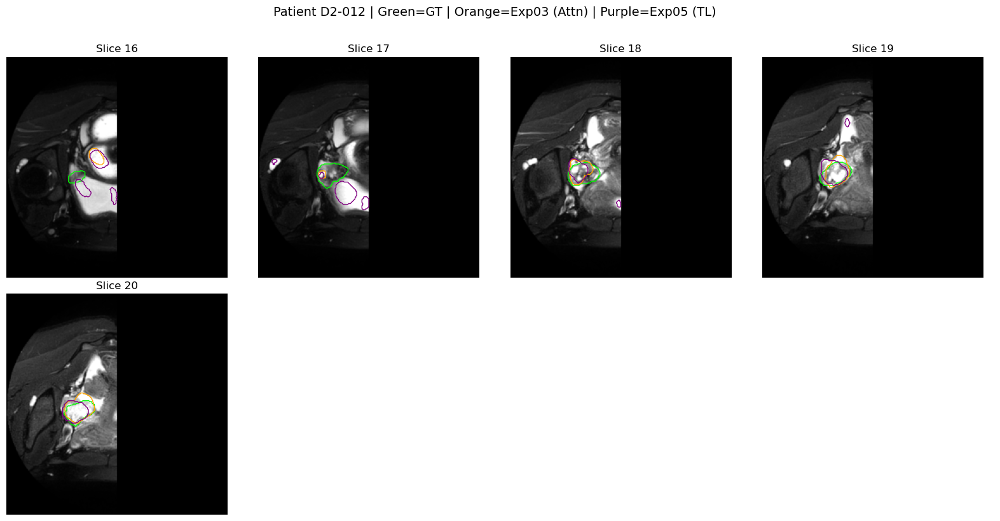


Processing Patient: D2-065


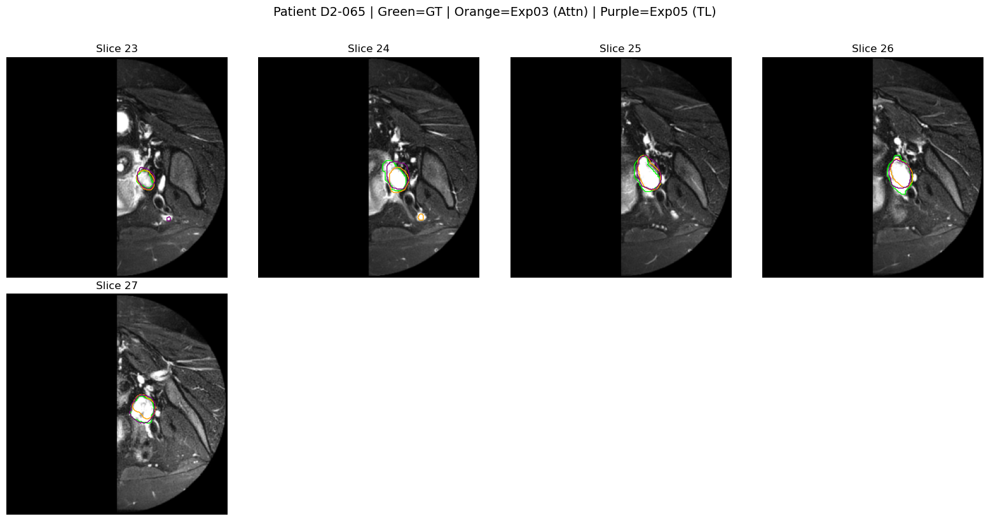


Processing Patient: D2-023


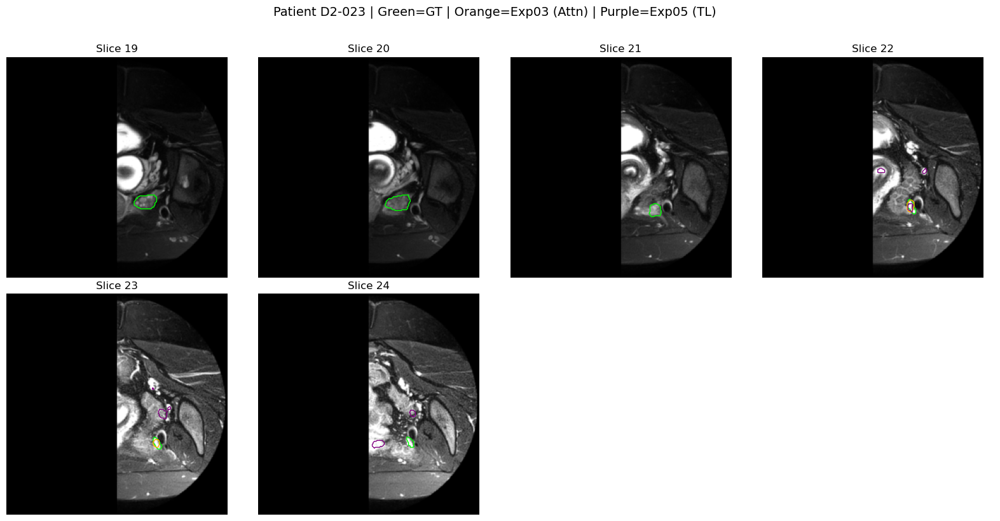


Processing Patient: D2-057


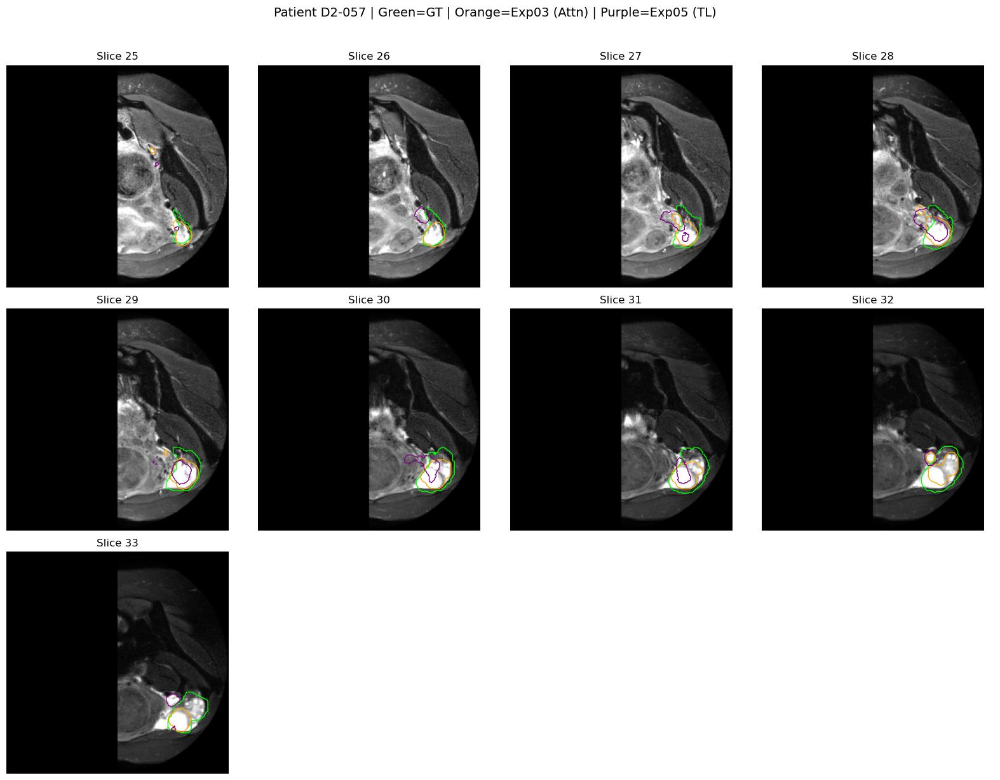

In [8]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import torchvision.transforms as T
from torchvision import models
import matplotlib.pyplot as plt
import nibabel as nib
from pathlib import Path

# --- CONFIGURATION ---
CONFIG = {
    "data_root": "../data/UT-EndoMRI/D2_Half_Split",
    "manifest_path": "../data/UT-EndoMRI/D2_Half_Split/d2_half_split_manifest.csv",
    # Paths to the specific experiment models
    "model_03_path": "../models/exp03_attention_half_split/best_model.pth",
    "model_05_path": "../models/exp05_tl_resnet34/best_model.pth",
    "device": "cuda" if torch.cuda.is_available() else "cpu",
    "image_size": 256,
    "val_fold": 1  # Fold 1 was the validation set for these experiments
}

# ==========================================
# 1. MODEL ARCHITECTURES
# ==========================================

# --- Common Parts (Attention Gate & DoubleConv) ---
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True), nn.BatchNorm2d(F_int))
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True), nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu = nn.ReLU(inplace=True)
    def forward(self, g, x):
        return x * self.psi(self.relu(self.W_g(g) + self.W_x(x)))

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.double_conv(x)

# --- Exp03: Attention U-Net (The Champion) ---
class AttentionUNet(nn.Module):
    def __init__(self, n_channels=1, n_classes=1):
        super(AttentionUNet, self).__init__()
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(64, 128))
        self.down2 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(128, 256))
        self.down3 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(256, 512))
        self.down4 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(512, 1024))
        self.up1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.att1 = AttentionGate(F_g=512, F_l=512, F_int=256)
        self.conv1 = DoubleConv(1024, 512)
        self.up2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.att2 = AttentionGate(F_g=256, F_l=256, F_int=128)
        self.conv2 = DoubleConv(512, 256)
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.att3 = AttentionGate(F_g=128, F_l=128, F_int=64)
        self.conv3 = DoubleConv(256, 128)
        self.up4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.att4 = AttentionGate(F_g=64, F_l=64, F_int=32)
        self.conv4 = DoubleConv(128, 64)
        self.outc = nn.Conv2d(64, n_classes, kernel_size=1)
    def forward(self, x):
        s1 = self.inc(x); s2 = self.down1(s1); s3 = self.down2(s2); s4 = self.down3(s3); s5 = self.down4(s4)
        d4 = self.up1(s5); s4_att = self.att1(g=d4, x=s4); d4 = self.conv1(torch.cat([d4, s4_att], dim=1))
        d3 = self.up2(d4); s3_att = self.att2(g=d3, x=s3); d3 = self.conv2(torch.cat([d3, s3_att], dim=1))
        d2 = self.up3(d3); s2_att = self.att3(g=d2, x=s2); d2 = self.conv3(torch.cat([d2, s2_att], dim=1))
        d1 = self.up4(d2); s1_att = self.att4(g=d1, x=s1); d1 = self.conv4(torch.cat([d1, s1_att], dim=1))
        return self.outc(d1)

# --- Exp05: Transfer Learning (ResNet34 + Attention Decoder) ---
class TLAttentionUNet(nn.Module):
    def __init__(self, n_classes=1):
        super(TLAttentionUNet, self).__init__()
        
        # Load Pretrained ResNet34
        resnet = models.resnet34(weights=models.ResNet34_Weights.DEFAULT)
        
        # Encoder
        self.enc0 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu) # 64 ch
        self.enc1 = resnet.maxpool # 64 ch
        self.enc2 = resnet.layer1  # 64 ch
        self.enc3 = resnet.layer2  # 128 ch
        self.enc4 = resnet.layer3  # 256 ch
        self.center = resnet.layer4 # 512 ch
        
        # Decoder (Attention)
        self.up1 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.att1 = AttentionGate(F_g=256, F_l=256, F_int=128)
        self.conv1 = DoubleConv(512, 256)
        
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.att2 = AttentionGate(F_g=128, F_l=128, F_int=64)
        self.conv2 = DoubleConv(256, 128)
        
        self.up3 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.att3 = AttentionGate(F_g=64, F_l=64, F_int=32)
        self.conv3 = DoubleConv(128, 64)
        
        self.up4 = nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2)
        self.att4 = AttentionGate(F_g=64, F_l=64, F_int=32)
        self.conv4 = DoubleConv(128, 64)
        
        self.outc = nn.Conv2d(64, n_classes, kernel_size=1)
        
    def forward(self, x):
        # Adapt Grayscale to RGB
        if x.size(1) == 1:
            x = x.repeat(1, 3, 1, 1)
            
        e0 = self.enc0(x)      # 128x128, 64ch
        e1 = self.enc1(e0)     # 64x64, 64ch
        e2 = self.enc2(e1)     # 64x64, 64ch
        e3 = self.enc3(e2)     # 32x32, 128ch
        e4 = self.enc4(e3)     # 16x16, 256ch
        c  = self.center(e4)   # 8x8, 512ch
        
        d1 = self.up1(c)
        s1 = self.att1(g=d1, x=e4)
        d1 = torch.cat([d1, s1], dim=1)
        d1 = self.conv1(d1)
        
        d2 = self.up2(d1)
        s2 = self.att2(g=d2, x=e3)
        d2 = torch.cat([d2, s2], dim=1)
        d2 = self.conv2(d2)
        
        d3 = self.up3(d2)
        s3 = self.att3(g=d3, x=e2) 
        d3 = torch.cat([d3, s3], dim=1)
        d3 = self.conv3(d3)
        
        d4 = self.up4(d3)
        s4 = self.att4(g=d4, x=e0)
        d4 = torch.cat([d4, s4], dim=1)
        d4 = self.conv4(d4)
        
        logits = self.outc(d4)
        # Upsample back to 256
        logits = F.interpolate(logits, scale_factor=2, mode='bilinear', align_corners=True)
        
        return logits

# ==========================================
# 2. EXECUTION
# ==========================================

def run_comparison():
    print("Initializing Comparison: Exp03 (Attention) vs Exp05 (Transfer Learning)...")
    
    # 1. Load Models
    model03 = AttentionUNet(n_channels=1, n_classes=1).to(CONFIG["device"])
    model05 = TLAttentionUNet(n_classes=1).to(CONFIG["device"])
    
    try:
        model03.load_state_dict(torch.load(CONFIG["model_03_path"], map_location=CONFIG["device"]))
        print("Loaded Exp03 Model.")
    except FileNotFoundError:
        print(f"ERROR: Could not find Exp03 model at {CONFIG['model_03_path']}")
        return

    try:
        model05.load_state_dict(torch.load(CONFIG["model_05_path"], map_location=CONFIG["device"]))
        print("Loaded Exp05 Model.")
    except FileNotFoundError:
        print(f"ERROR: Could not find Exp05 model at {CONFIG['model_05_path']}")
        return
        
    model03.eval()
    model05.eval()
    
    # 2. Load Data Manifest
    df = pd.read_csv(CONFIG["manifest_path"])
    val_patients = df[df['fold'] == CONFIG["val_fold"]]['pid'].unique()
    
    print(f"Found {len(val_patients)} patients in Validation Set (Fold {CONFIG['val_fold']}).")
    
    # 3. Loop Patients
    for pid in val_patients:
        print(f"\nProcessing Patient: {pid}")
        
        row = df[(df['fold'] == CONFIG["val_fold"]) & (df['pid'] == pid)].iloc[0]
        
        img_path = Path(CONFIG["data_root"]) / Path(row['t2fs_path']).name
        msk_path = Path(CONFIG["data_root"]) / Path(row['ov_path']).name
        
        if not img_path.exists():
            print(f"  File not found: {img_path}")
            continue
            
        img_vol = nib.load(str(img_path)).get_fdata()
        msk_vol = nib.load(str(msk_path)).get_fdata()
        
        # Find positive slices
        z_sums = np.sum(msk_vol, axis=(0,1))
        valid_slices = np.where(z_sums > 0)[0]
        
        if len(valid_slices) == 0:
            print("  No positive slices (Skipping)")
            continue
            
        # 4. Prepare Plot
        n_slices = len(valid_slices)
        cols = 4
        rows = int(np.ceil(n_slices / cols))
        fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
        if rows==1 and cols==1: axes=[axes]
        axes = np.array(axes).flatten()
        
        fig.suptitle(f"Patient {pid} | Green=GT | Orange=Exp03 (Attn) | Purple=Exp05 (TL)", fontsize=14, y=1.02)
        
        for i, z in enumerate(valid_slices):
            ax = axes[i]
            
            # --- Preprocessing (Standard Min-Max) ---
            img = img_vol[:,:,z]
            msk = msk_vol[:,:,z]
            
            p1, p99 = np.percentile(img, 1), np.percentile(img, 99)
            img_norm = np.clip(img, p1, p99)
            img_norm = (img_norm - img_norm.min()) / (img_norm.max() - img_norm.min() + 1e-8)
            
            # Resize to 256 for Model
            img_t = torch.from_numpy(img_norm.T).float().unsqueeze(0).unsqueeze(0)
            img_t = TF.resize(img_t, [CONFIG["image_size"], CONFIG["image_size"]], 
                              interpolation=T.InterpolationMode.BILINEAR, antialias=True)
            
            # Resize Mask for Display (to match 256)
            msk_t = torch.from_numpy(msk.T).float().unsqueeze(0).unsqueeze(0)
            msk_t = TF.resize(msk_t, [CONFIG["image_size"], CONFIG["image_size"]], 
                              interpolation=T.InterpolationMode.NEAREST, antialias=True)
            
            # --- Inference ---
            img_gpu = img_t.to(CONFIG["device"])
            
            with torch.no_grad():
                # Exp03
                logits03 = model03(img_gpu)
                pred03 = (torch.sigmoid(logits03) > 0.5).float().cpu().numpy().squeeze()
                
                # Exp05
                logits05 = model05(img_gpu)
                pred05 = (torch.sigmoid(logits05) > 0.5).float().cpu().numpy().squeeze()
            
            # --- Plotting ---
            # Background
            ax.imshow(img_t.squeeze().numpy(), cmap='gray', origin='lower')
            
            # GT (Green)
            gt_np = msk_t.squeeze().numpy()
            if np.sum(gt_np) > 0:
                ax.contour(gt_np, colors='lime', linewidths=1, levels=[0.5])
                
            # Exp03 (Orange)
            if np.sum(pred03) > 0:
                ax.contour(pred03, colors='orange', linewidths=1, levels=[0.5])
                
            # Exp05 (Purple)
            if np.sum(pred05) > 0:
                ax.contour(pred05, colors='purple', linewidths=1, levels=[0.5])
                
            ax.set_title(f"Slice {z}")
            ax.axis('off')
            
        # Clean up empty axes
        for j in range(i+1, len(axes)):
            axes[j].axis('off')
            
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    run_comparison()